In [849]:
import os

if os.path.basename(os.getcwd()) == 'notebooks':
    os.chdir('../../../AutexysHost/source')

from utilities import DataLoggerUtility as dlu
from utilities import DataPlotterUtility as dpu
from utilities import FET_Modeling as fet_model
from procedures import Device_History as DH
from procedures import AFM_Control as afm_ctrl
import launcher
import defaults

from matplotlib import pyplot as plt
import numpy as np

import scipy.optimize as sci_opt

%config InlineBackend.figure_format = 'svg'

In [850]:
devHist = dlu.loadSpecificDeviceHistory('../../AutexysData/jay/MoS2FET/JM4/H/40-41', 'NoiseCollection.json', minExperiment=10, maxExperiment=10)


In [54]:
from utilities.PlotDefinitions.Noise.GateUnfiltered import extractNoiseMagnitude

gateVoltages, drainVoltages, currentAverages, unfilteredNoise, filteredNoise = extractNoiseMagnitude(devHist, groupBy='drain')

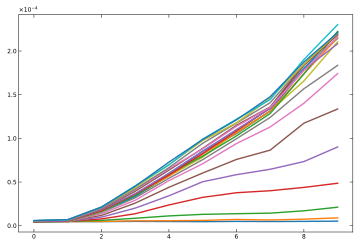

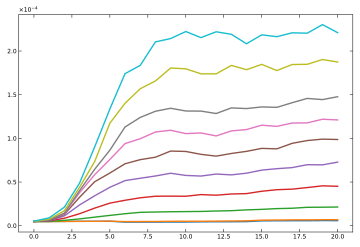

In [274]:
noise = np.array(filteredNoise)

plt.plot(noise)
plt.show()

plt.plot(noise.T)
plt.show()

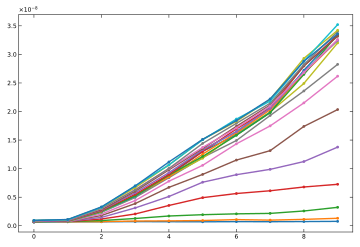

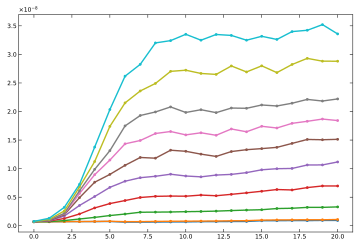

In [883]:
import scipy.signal

def noiseFromData(data):
    return 4*np.std(data) # 95% interval

def noiseFromData(data):
    data = np.array(data)
    IdFs = np.fft.rfftfreq(data.size)
    IdXs = np.fft.rfft(data.flatten())
    IdAs = np.abs(IdXs)
    
    return np.sqrt(np.sum(IdAs[1:]**2))

def noiseFromData(data):
    data = np.array(data)
    IdFs = np.fft.rfftfreq(data.size)
    IdXs = np.fft.rfft(data.flatten())
    IdPs = np.angle(IdXs)
    IdAs = np.abs(IdXs)
    
    logFs = np.log(IdFs[1:])
    logAs = np.log(IdAs[1:])
    logAsFit = np.polyfit(logFs, logAs, 1)
    logAsFitVals = np.poly1d(logAsFit)(logFs)
    
    for i in range(0):
        logAsFitVals = np.poly1d(np.polyfit(logFs, np.maximum(logAs, logAsFitVals), 1))(logFs)
    
    As = np.exp(logAsFitVals)
    
    return np.sqrt(np.sum(As**2))

def noiseFromData(data):
    data = np.array(data)
    IdFs = np.fft.rfftfreq(data.size)
    IdXs = np.fft.rfft(data.flatten())
    IdPs = np.angle(IdXs)
    IdAs = np.abs(IdXs)
    
    logFs = np.log(IdFs[1:])
    logAs = np.log(IdAs[1:])
    
    logFslog = np.linspace(np.min(logFs), np.max(logFs), logFs.size)
    logAslog = np.interp(logFslog, logFs, logAs)
    
    logAsFitlog = np.polyfit(logFslog, logAslog, 2)
    logAsFitlogVals = np.poly1d(logAsFitlog)(logFslog)
    
    logAsFitVals = np.interp(logFs, logFslog, logAsFitlogVals)
    
    As = np.exp(logAsFitVals)
    
    return np.sqrt(np.sum(As**2))

def noiseFromData(data):
    data = np.array(data)
    data = data.flatten()
    
    windowSize = 50
    slidingWindow = np.arange(windowSize)[None, :] + windowSize*np.arange(data.size//windowSize)[:, None]
    stds = np.std(data[slidingWindow], axis=1)
    
    return np.median(stds)

def filter60HzAndHarmonics(Id, timestamps):
    return Id
    
    Id = np.array(Id)
    timestamps = np.array(timestamps)
    
    dt = np.median(np.diff(timestamps))
    Fsamp = 1/dt
    Fs = np.fft.rfftfreq(Id.size, d=dt)
    Xs = np.fft.rfft(Id)
    As = np.abs(Xs)*dt
    
    minAmbientIndex = np.argmax(Fs > 50)
    ambientNoiseIndexes = np.argpartition(As[minAmbientIndex:], -100)[-100:] + minAmbientIndex
    ambientNoiseFs = Fs[ambientNoiseIndexes]
    
    distances = np.abs(ambientNoiseFs - np.round(ambientNoiseFs/60)*60)
    maxDistance = np.clip(3*Fs[1], 2, 8)
    ambientNoiseIndexes = ambientNoiseIndexes[distances < maxDistance]
    
    ambientNoiseFs = Fs[ambientNoiseIndexes]
    ambientNoiseAs = As[ambientNoiseIndexes]
    
    for i in np.sort(ambientNoiseIndexes):
        Xs[i] = Xs[i-1]
    
    IdFiltered = np.fft.irfft(Xs)
    
    b, a = scipy.signal.butter(1, 1000/50000, btype='highpass', analog=False)
    IdFiltered = np.mean(IdFiltered) + scipy.signal.filtfilt(b, a, IdFiltered)
    
    return IdFiltered

def extractNoiseMagnitude(deviceHistory, groupBy=None):
    # === Extract noise magnitude from data ===
    gateVoltages = []
    drainVoltages = []
    currentAverages = []
    unfilteredNoise = []
    filteredNoise = []
    Id = []
    for i in range(len(deviceHistory)):
        vgs = deviceHistory[i]['runConfigs']['NoiseCollection']['gateVoltage']
        vds = deviceHistory[i]['runConfigs']['NoiseCollection']['drainVoltage']
        timestamps = deviceHistory[i]['Results']['timestamps']
        id_unfiltered = deviceHistory[i]['Results']['id_data']
        id_filtered = filter60HzAndHarmonics(id_unfiltered, timestamps) 
        
        gateVoltages.append(vgs)
        drainVoltages.append(vds)
        unfilteredNoise.append(noiseFromData(id_unfiltered))
        filteredNoise.append(noiseFromData(id_filtered))
        currentAverages.append(np.mean(id_unfiltered))
        Id.append(id_unfiltered)
        
    # === Group data into sub-arrays ===
    gateVoltages_sorted = []
    drainVoltages_sorted = []
    currentAverages_sorted = []
    unfilteredNoise_sorted = []
    filteredNoise_sorted = []
    Id_sorted = []
    if(groupBy == 'drain'):
        # Get a set of unique drainVoltages, and group other arrays accordingly
        for i in range(len(gateVoltages)):
            if(drainVoltages[i] in drainVoltages_sorted):
                index = drainVoltages_sorted.index(drainVoltages[i])
                gateVoltages_sorted[index].append(gateVoltages[i])
                currentAverages_sorted[index].append(currentAverages[i])
                unfilteredNoise_sorted[index].append(unfilteredNoise[i])
                filteredNoise_sorted[index].append(filteredNoise[i])
                Id_sorted[index].append(Id[i])
            else:
                drainVoltages_sorted.append(drainVoltages[i])
                gateVoltages_sorted.append([gateVoltages[i]])
                currentAverages_sorted.append([currentAverages[i]])
                unfilteredNoise_sorted.append([unfilteredNoise[i]])
                filteredNoise_sorted.append([filteredNoise[i]])
                Id_sorted.append([Id[i]])
        
        # Sort outer-level arrays by V_DS
        drainVoltages_sorted, gateVoltages_sorted, currentAverages_sorted, unfilteredNoise_sorted, filteredNoise_sorted, Id_sorted = (list(elem) for elem in zip(*sorted(zip(drainVoltages_sorted, gateVoltages_sorted, currentAverages_sorted, unfilteredNoise_sorted, filteredNoise_sorted, Id_sorted))))
        for i in range(len(gateVoltages_sorted)):
            # Sort inner-level arrays by V_GS
            gateVoltages_sorted[i], currentAverages_sorted[i], unfilteredNoise_sorted[i], filteredNoise_sorted[i], Id_sorted[i] = (list(elem) for elem in zip(*sorted(zip(gateVoltages_sorted[i], currentAverages_sorted[i], unfilteredNoise_sorted[i], filteredNoise_sorted[i], Id_sorted[i]))))
    elif(groupBy == 'gate'):
        # Get a set of unique gateVoltages, and group other arrays accordingly
        for i in range(len(gateVoltages)):
            if(gateVoltages[i] in gateVoltages_sorted):
                index = gateVoltages_sorted.index(gateVoltages[i])
                drainVoltages_sorted[index].append(drainVoltages[i])
                currentAverages_sorted[index].append(currentAverages[i])
                unfilteredNoise_sorted[index].append(unfilteredNoise[i])
                filteredNoise_sorted[index].append(filteredNoise[i])
                Id_sorted[index].append(Id[i])
            else:
                gateVoltages_sorted.append(gateVoltages[i])
                drainVoltages_sorted.append([drainVoltages[i]])
                currentAverages_sorted.append([currentAverages[i]])
                unfilteredNoise_sorted.append([unfilteredNoise[i]])
                filteredNoise_sorted.append([filteredNoise[i]])
                Id_sorted.append([Id[i]])
        
        # Sort outer-level arrays by V_GS
        gateVoltages_sorted, drainVoltages_sorted, currentAverages_sorted, unfilteredNoise_sorted, filteredNoise_sorted, Id_sorted = (list(elem) for elem in zip(*sorted(zip(gateVoltages_sorted, drainVoltages_sorted, currentAverages_sorted, unfilteredNoise_sorted, filteredNoise_sorted, Id_sorted))))
        for i in range(len(gateVoltages_sorted)):
            # Sort inner-level arrays by V_DS
            drainVoltages_sorted[i], currentAverages_sorted[i], unfilteredNoise_sorted[i], filteredNoise_sorted[i], Id_sorted = (list(elem) for elem in zip(*sorted(zip(drainVoltages_sorted[i], currentAverages_sorted[i], unfilteredNoise_sorted[i], filteredNoise_sorted[i], Id_sorted[i]))))
    else:
        # Don't group into sub-arrays
        gateVoltages_sorted = gateVoltages
        drainVoltages_sorted = drainVoltages
        currentAverages_sorted = currentAverages
        unfilteredNoise_sorted = unfilteredNoise
        filteredNoise_sorted = filteredNoise
        Id_sorted = Id
        
    return gateVoltages_sorted, drainVoltages_sorted, currentAverages_sorted, unfilteredNoise_sorted, filteredNoise_sorted, Id_sorted

gateVoltages, drainVoltages, currentAverages, unfilteredNoise, filteredNoise, Id = extractNoiseMagnitude(devHist, groupBy='drain')

noise = np.array(unfilteredNoise)

plt.plot(noise, '.-')
plt.show()

plt.plot(noise.T, '.-')
plt.show()


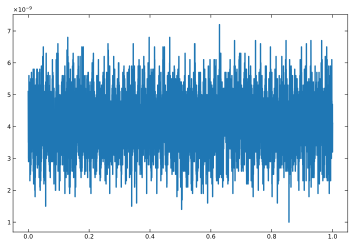

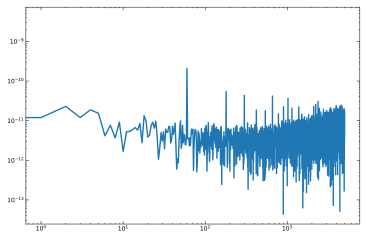

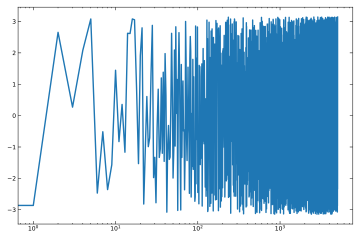

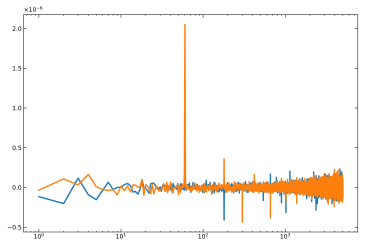

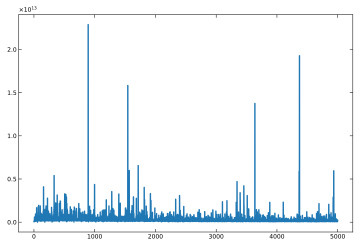

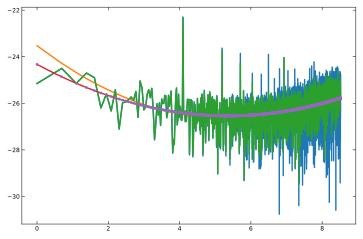

In [496]:
Ids = np.array(Id)
times = np.array(devHist[0]['Results']['timestamps'])
times -= times[0]

dt = np.median(np.diff(times.flatten()))
IdFs = np.fft.rfftfreq(Ids[0][0].size, d=dt)
IdXs = np.fft.rfft(Ids[0][0].flatten())
IdAs = np.abs(IdXs)*dt

plt.plot(times, Ids[0][0])
plt.show()

plt.loglog(IdFs, IdAs)
plt.show()

plt.semilogx(IdFs, np.angle(IdXs))
plt.show()

plt.semilogx(IdFs[1:], np.real(IdXs[1:]))
plt.semilogx(IdFs[1:], np.imag(IdXs[1:]))
plt.show()

plt.plot(1/IdAs[1:])
plt.show()

xs = np.log(IdFs[1:])
ys = np.log(IdAs[1:])
plt.plot(xs, ys)
plt.plot(xs, np.poly1d(np.polyfit(xs, ys, 2))(xs))

xsNew = np.linspace(np.min(xs), np.max(xs), xs.size)
ysNew = np.interp(xsNew, xs, ys)
plt.plot(xsNew, ysNew)
fitNew = np.poly1d(np.polyfit(xsNew, ysNew, 2))(xsNew)
plt.plot(xsNew, fitNew)

plt.plot(xs, np.interp(xs, xsNew, fitNew), '.')

plt.show()

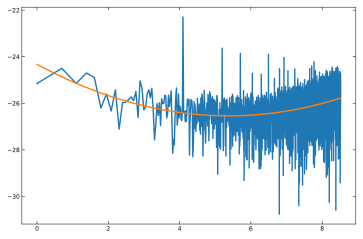

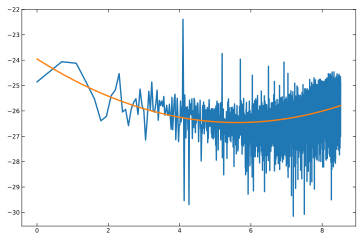

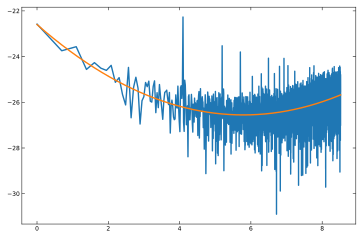

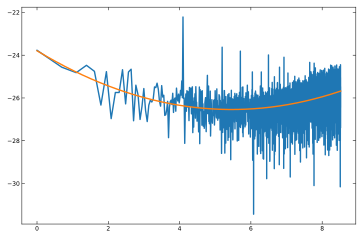

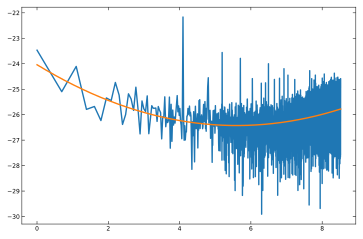

...

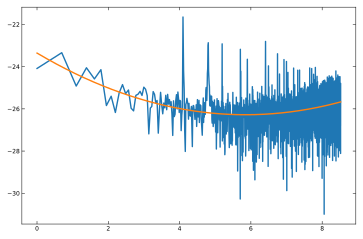

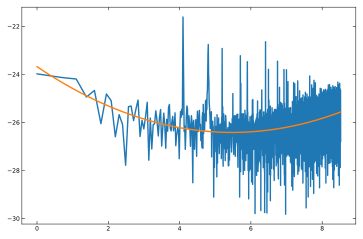

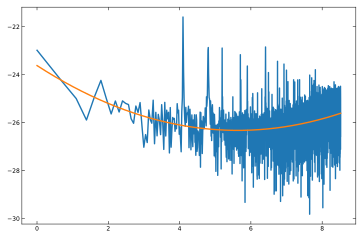

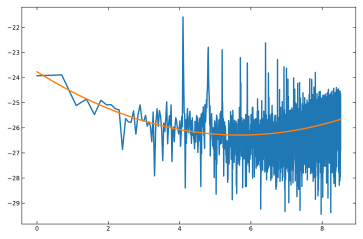

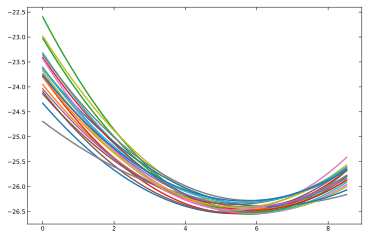

In [505]:
Ids = np.array(Id)
times = np.array(devHist[0]['Results']['timestamps'])
times -= times[0]

dt = np.median(np.diff(times.flatten()))
IdFs = np.fft.rfftfreq(Ids[0][0].size, d=dt)

for i in range(Ids[9].shape[0]):
    IdXs = np.fft.rfft(Ids[0][i].flatten())
    IdAs = np.abs(IdXs)*dt
    
    xs = np.log(IdFs[1:])
    ys = np.log(IdAs[1:])
    xsNew = np.linspace(np.min(xs), np.max(xs), xs.size)
    ysNew = np.interp(xsNew, xs, ys)
    fitNew = np.poly1d(np.polyfit(xsNew, ysNew, 2))(xsNew)
    
    plt.plot(xs, ys)
    plt.plot(xsNew, fitNew)
    plt.show()

for i in range(Ids[9].shape[0]):
    IdXs = np.fft.rfft(Ids[0][i].flatten())
    IdAs = np.abs(IdXs)*dt
    
    xs = np.log(IdFs[1:])
    ys = np.log(IdAs[1:])
    xsNew = np.linspace(np.min(xs), np.max(xs), xs.size)
    ysNew = np.interp(xsNew, xs, ys)
    fitNew = np.poly1d(np.polyfit(xsNew, ysNew, 2))(xsNew)
    
    plt.plot(xsNew, fitNew)
plt.show()

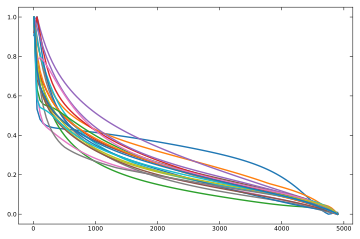

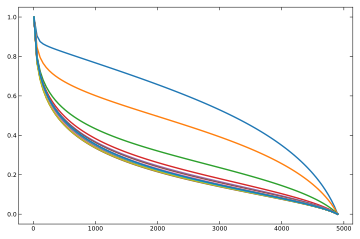

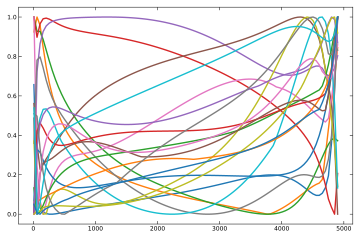

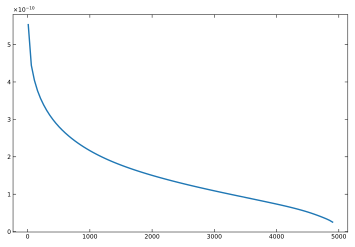

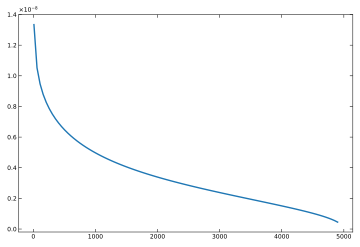

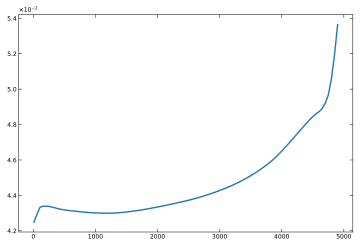

In [608]:
gateVoltages, drainVoltages, currentAverages, unfilteredNoise, filteredNoise, Id = extractNoiseMagnitude(devHist, groupBy='drain')

def normalize(data):
    data = data - np.min(data)
    data /= np.max(data)
    return data

Ids = np.array(Id)
times = np.array(devHist[0]['Results']['timestamps'])
times -= times[0]

allErrors = []
allMeans = []
allRatios = []

for i in range(len(Ids[0,:])):
    F0s = np.linspace(10,4900,100)
    errors = []
    means = []
    
    for F0 in F0s:
        stds = []
        for Id in Ids[:,i]:
            Id -= np.mean(Id)
            b, a = scipy.signal.butter(1, F0/5000, btype='highpass', analog=False)
            IdFiltered = scipy.signal.filtfilt(b, a, Id)
            stds.append(np.std(IdFiltered))
        fit = np.poly1d(np.polyfit(drainVoltages, stds, 2))(drainVoltages)
        errors.append(np.mean(np.abs(fit - stds)))
        means.append(np.mean(stds))
    
    errors = np.array(errors)
    means = np.array(means)
    
    allErrors.append(errors)
    allMeans.append(means)
    allRatios.append(errors/means)
    
    plt.figure(1)
    plt.plot(F0s, normalize(errors))
    plt.figure(2)
    plt.plot(F0s, normalize(means))
    plt.figure(3)
    plt.plot(F0s, normalize(errors/means))

plt.show()

plt.plot(F0s, np.mean(allErrors, axis=0))
plt.show()
plt.plot(F0s, np.mean(allMeans, axis=0))
plt.show()
plt.plot(F0s, np.mean(allRatios, axis=0))
plt.show()

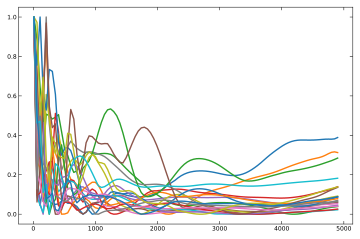

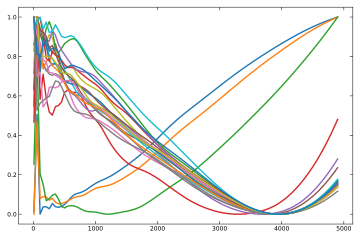

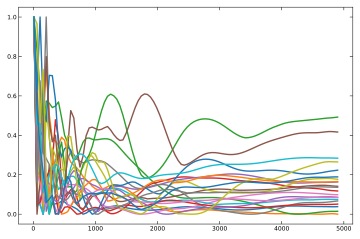

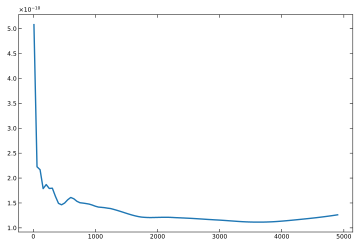

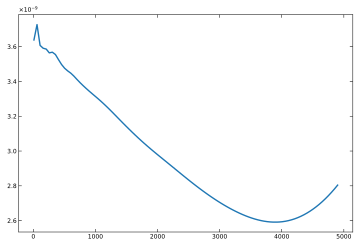

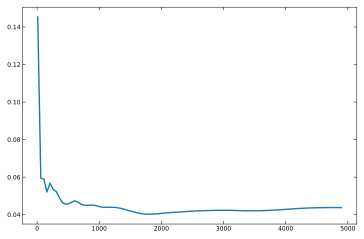

In [605]:
gateVoltages, drainVoltages, currentAverages, unfilteredNoise, filteredNoise, Id = extractNoiseMagnitude(devHist, groupBy='drain')

def normalize(data):
    data = data - np.min(data)
    data /= np.max(data)
    return data

Ids = np.array(Id)
times = np.array(devHist[0]['Results']['timestamps'])
times -= times[0]

allErrors = []
allMeans = []
allRatios = []

for i in range(len(Ids[0,:])):
    F0s = np.linspace(10,4900,100)
    errors = []
    means = []
    
    for F0 in F0s:
        stds = []
        for Id in Ids[:,i]:
            Id -= np.mean(Id)
            b, a = scipy.signal.iirpeak(F0/5000, 2)
            IdFiltered = scipy.signal.filtfilt(b, a, Id)
            stds.append(np.std(IdFiltered))
        fit = np.poly1d(np.polyfit(drainVoltages, stds, 2))(drainVoltages)
        errors.append(np.mean(np.abs(fit - stds)))
        means.append(np.mean(stds))
    
    errors = np.array(errors)
    means = np.array(means)
    
    allErrors.append(errors)
    allMeans.append(means)
    allRatios.append(errors/means)
    
    plt.figure(1)
    plt.plot(F0s, normalize(errors))
    plt.figure(2)
    plt.plot(F0s, normalize(means))
    plt.figure(3)
    plt.plot(F0s, normalize(errors/means))

plt.show()

plt.plot(F0s, np.mean(allErrors, axis=0))
plt.show()
plt.plot(F0s, np.mean(allMeans, axis=0))
plt.show()
plt.plot(F0s, np.mean(allRatios, axis=0))
plt.show()

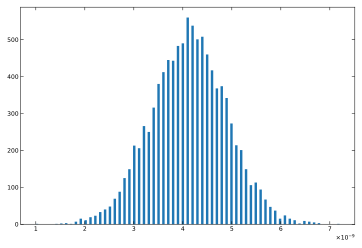

Minimum point spacing is 1e-10 A
Median current is 4.1e-09 A
Compliance could be 0.0001048576 A


In [519]:
spacings = np.abs(np.diff(Ids[0][0]))
spacings = spacings[spacings > 0]
minSpacing = np.min(spacings)

bins = 2*int(np.ptp(Ids[0][0])/minSpacing)+1
plt.hist(Ids[0][0], bins=bins)
plt.show()

print('Minimum point spacing is', minSpacing, 'A')
print('Median current is', np.median(Ids[0][0]), 'A')
print('Compliance could be', 2**20*minSpacing, 'A')

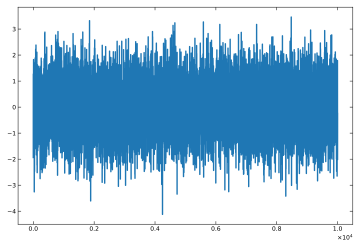

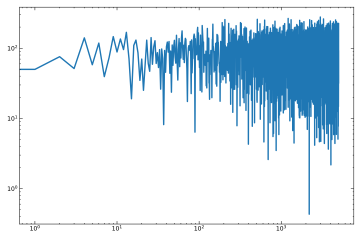

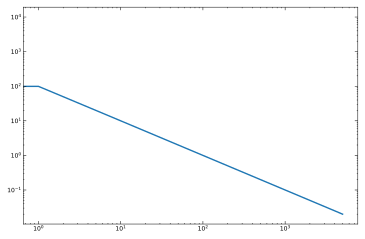

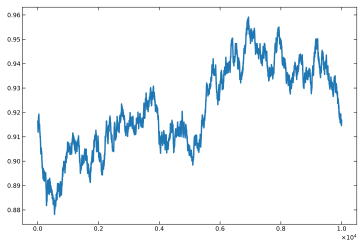

In [114]:
testId = np.random.normal(loc=0,scale=1,size=10000)
testXs = np.fft.rfft(testId)
testFs = np.fft.rfftfreq(testId.size)
plt.plot(testId)
plt.show()
plt.loglog(np.abs(testXs))
plt.show()

testXs = 0.01/(0.01*testFs[1]+testFs)*np.exp(1j*testId[0:5001]*2*np.pi)
plt.loglog(np.abs(testXs))
plt.show()
testId = np.fft.irfft(testXs)
plt.plot(testId)
plt.show()

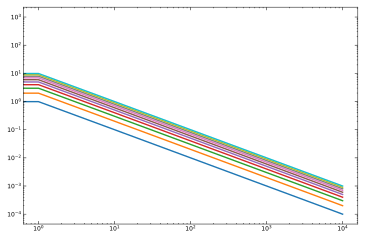

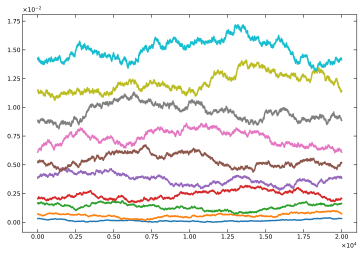

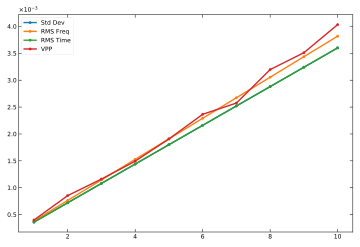

1.06055410898


In [408]:
fig1 = plt.figure(1)
fig2 = plt.figure(2)

stds = []
fints = []
rmsf = []
rmst = []

vpp = []

multipliers = np.linspace(1,10,10)

for multiplier in multipliers:
    N = int(10e3)
    testFs = np.linspace(0, 1e4, N)
    testPs = np.random.normal(loc=0,scale=1,size=N)
    beta = 1
    testXs = multiplier*1/(testFs+1e-2*testFs[1])**beta*np.exp(1j*testPs*2*np.pi)
    testAs = np.abs(testXs)
    plt.figure(1)
    plt.loglog(testFs, np.abs(testXs))
    
    plt.figure(2)
    testId = np.fft.irfft(testXs)
    testId -= np.mean(testId)
    plt.plot(testId + multiplier**2*1.5e-4)
    
    stds.append(np.std(testId))
    fints.append(np.sum(testAs)*(testFs[2]-testFs[1]))
    rmsf.append(np.sqrt(np.sum(testAs[1:]**2))/testAs.size)
    rmst.append(np.sqrt(np.mean((testId - np.mean(testId))**2)))
    vpp.append(np.ptp(testId))

stds = np.array(stds)
fints = np.array(fints)
rmsf = np.array(rmsf)
rmst = np.array(rmst)

plt.figure(3)
plt.plot(multipliers, 4*stds, '.-', label='Std Dev')
# plt.plot(multipliers, fints/np.max(testFs)/10, '.-', label='Fints')
# plt.plot(multipliers, rmsf/np.max(testFs), '.-', label='RMS')
plt.plot(multipliers, 3*rmsf, '.-', label='RMS Freq')
plt.plot(multipliers, 4*rmst, '.-', label='RMS Time')
plt.plot(multipliers, vpp, '.-', label='VPP')
plt.legend()
plt.show()

print(np.max(3*rmsf)/np.max(4*stds))

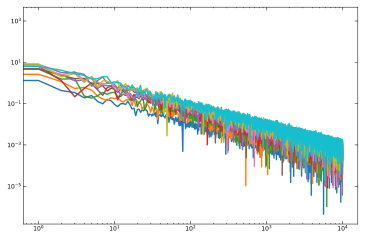

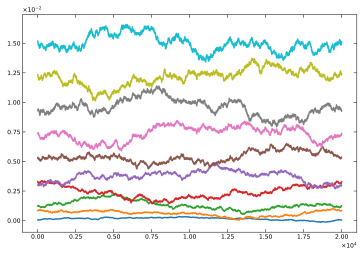

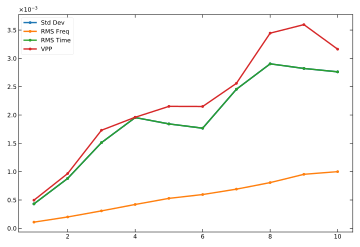

0.344698229733


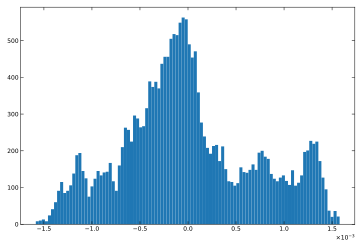

In [401]:
fig1 = plt.figure(1)
fig2 = plt.figure(2)

stds = []
fints = []
rmsf = []
rmst = []

vpp = []

multipliers = np.linspace(1,10,10)

for multiplier in multipliers:
    N = int(10e3)
    testFs = np.linspace(0, 1e4, N)
    testPs = np.random.normal(loc=0,scale=1,size=N)
    testPs = 2*np.pi*np.random.randn(N)
    beta = 1
#     testXs = multiplier*1/(testFs+1e-2*testFs[1])**beta*np.exp(1j*testPs*2*np.pi)
    testXs = multiplier*(1+0.3*np.random.randn(N))/(testFs+1e-2*testFs[1])**beta*np.exp(1j*testPs*2*np.pi)
    testAs = np.abs(testXs)
    plt.figure(1)
    plt.loglog(testFs, np.abs(testXs))
    
    plt.figure(2)
    testId = np.fft.irfft(testXs)
    testId -= np.mean(testId)
    plt.plot(testId + multiplier**2*1.5e-4)
    
    stds.append(np.std(testId))
    fints.append(np.sum(testAs)*(testFs[2]-testFs[1]))
    rmsf.append(np.sqrt(np.sum(testAs[10:]**2))/testAs.size)
    rmst.append(np.sqrt(np.mean((testId - np.mean(testId))**2)))
    vpp.append(np.ptp(testId))

stds = np.array(stds)
fints = np.array(fints)
rmsf = np.array(rmsf)
rmst = np.array(rmst)

plt.figure(3)
plt.plot(multipliers, 4*stds, '.-', label='Std Dev')
# plt.plot(multipliers, fints/np.max(testFs)/10, '.-', label='Fints')
# plt.plot(multipliers, rmsf/np.max(testFs), '.-', label='RMS')
plt.plot(multipliers, 3*rmsf, '.-', label='RMS Freq')
plt.plot(multipliers, 4*rmst, '.-', label='RMS Time')
plt.plot(multipliers, vpp, '.-', label='VPP')
plt.legend()
plt.show()

plt.hist(testId, bins=100)

print(np.max(3*rmsf)/np.max(4*stds))

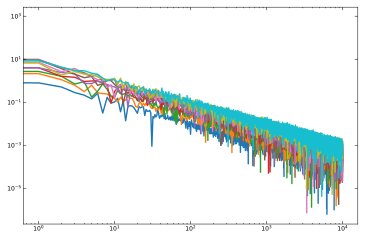

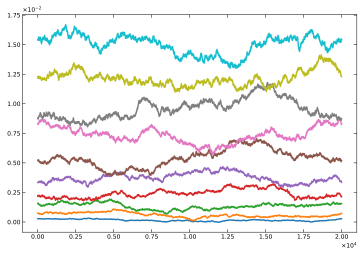

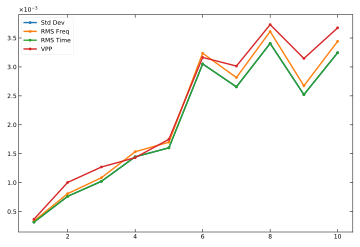

1.06055410844


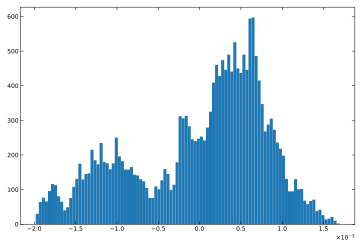

In [299]:
fig1 = plt.figure(1)
fig2 = plt.figure(2)

stds = []
fints = []
rmsf = []
rmst = []

vpp = []

multipliers = np.linspace(1,10,10)

for multiplier in multipliers:
    N = int(10e3)
    testFs = np.linspace(0, 1e4, N)
    testPs = np.random.normal(loc=0,scale=1,size=N)
    testPs = 2*np.pi*np.random.randn(N)
    beta = 1
#     testXs = multiplier*1/(testFs+1e-2*testFs[1])**beta*np.exp(1j*testPs*2*np.pi)
    testXs = multiplier*(1+0.3*np.random.randn(N))/(testFs+1e-2*testFs[1])**beta*np.exp(1j*testPs*2*np.pi)
    testAs = np.abs(testXs)
#     testAs[1:] = 1/scipy.signal.savgol_filter(1/testAs[1:], 101, 1)
    plt.figure(1)
    plt.loglog(testFs, testAs)
    
    plt.figure(2)
    testId = np.fft.irfft(testXs)
    testId -= np.mean(testId)
    plt.plot(testId + multiplier**2*1.5e-4)
    
    stds.append(np.std(testId))
    fints.append(np.sum(testAs)*(testFs[2]-testFs[1]))
    rmsf.append(np.sqrt(np.sum(testAs[1:]**2))/testAs.size)
    rmst.append(np.sqrt(np.mean((testId - np.mean(testId))**2)))
    vpp.append(np.ptp(testId))

stds = np.array(stds)
fints = np.array(fints)
rmsf = np.array(rmsf)
rmst = np.array(rmst)

plt.figure(3)
plt.plot(multipliers, 4*stds, '.-', label='Std Dev')
# plt.plot(multipliers, fints/np.max(testFs)/10, '.-', label='Fints')
# plt.plot(multipliers, rmsf/np.max(testFs), '.-', label='RMS')
plt.plot(multipliers, 3*rmsf, '.-', label='RMS Freq')
plt.plot(multipliers, 4*rmst, '.-', label='RMS Time')
plt.plot(multipliers, vpp, '.-', label='VPP')
plt.legend()
plt.show()

plt.hist(testId, bins=100)

print(np.max(3*rmsf)/np.max(4*stds))

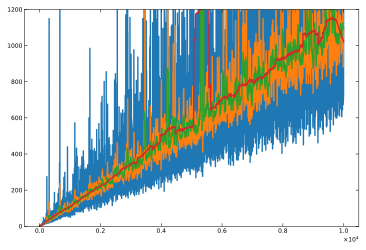

In [350]:
plt.plot(1/(testAs[1:]))
plt.plot((scipy.signal.savgol_filter(1/testAs[1:], 11, 1)))
plt.plot((scipy.signal.savgol_filter(1/testAs[1:], 51, 1)))
plt.plot((scipy.signal.savgol_filter(1/testAs[1:], testAs.size//20 + 1, 1, mode='interp')))
plt.ylim([0,1.2e3])
plt.show()

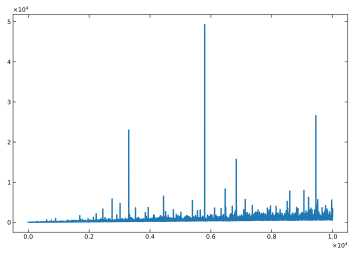

In [407]:
plt.plot(1/testAs[1:])

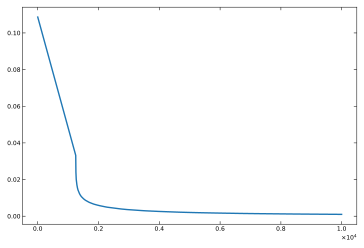

In [345]:
plt.plot(scipy.signal.savgol_filter(testAs[1:], testAs.size//4 + 1, 1, mode='interp'))
plt.show()

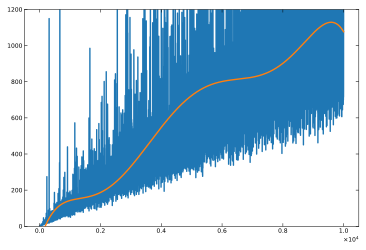

In [373]:
plt.plot(1/testAs[1:])
xs = np.linspace(0,testAs.size-1,testAs.size-1)
plt.plot(np.poly1d(np.polyfit(xs,1/testAs[1:],6))(xs))
plt.ylim([0,1.2e3])
plt.show()

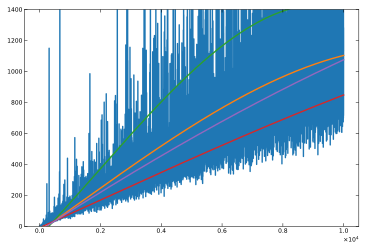

In [388]:
def polyfitNoOutliers(yvals, order, iterations=3):
    yvals = np.array(yvals)
    xs = np.linspace(0, yvals.size, yvals.size)
    midFit = np.poly1d(np.polyfit(xs, yvals, order))(xs)
    topFit = np.copy(midFit)
    botFit = np.copy(midFit)
    
    for i in range(iterations):
        topFit = np.poly1d(np.polyfit(xs, np.maximum(yvals, topFit), order))(xs)
        botFit = np.poly1d(np.polyfit(xs, np.minimum(yvals, botFit), order))(xs)
    
    yvalsBounded = np.minimum(np.maximum(yvals, botFit), topFit)
    
    finalFit = np.poly1d(np.polyfit(xs, yvalsBounded, order))(xs)
    
    plt.plot(yvals)
    plt.plot(midFit)
    plt.plot(topFit)
    plt.plot(botFit)
    plt.plot(finalFit)
    plt.ylim([0,1.4e3])
    plt.show()

polyfitNoOutliers(1/testAs[1:], 3)

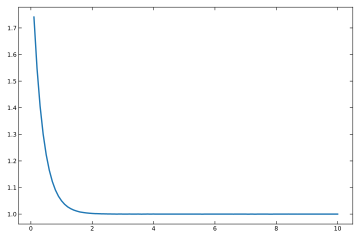

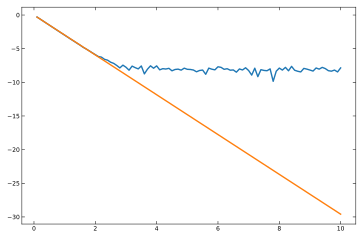

In [765]:
xs = np.linspace(0.1,10,100)
ys = 1 + np.exp(-3*xs)
ys *= 1 + 0.0001*np.random.randn(xs.size)

plt.plot(xs, ys)
plt.show()

fitxs = np.copy(xs)
fitys = np.copy(ys)

fitys =  ys - np.min(ys)
fitys += np.min(fitys[fitys > 0])

fitys = np.log(fitys)

plt.plot(fitxs, fitys)
plt.plot(fitxs, np.poly1d(np.polyfit(fitxs, fitys, 1, w=(fitys-np.min(fitys))**4))(fitxs))
plt.show()

In [776]:
xs = np.linspace(0.1,10,100)
ys = 1 + 2*np.exp(-3*xs)
# ys +=       0.1*np.random.randn(xs.size)
ys *= 1 + 0.1*np.random.randn(xs.size)

y1 = ys[0]
y2 = ys[ys.size//2]
y3 = ys[-1]
t1 = xs[0]
t2 = xs[xs.size//2]
t3 = xs[-1]
b = 2/(t1-t3)*np.log((y1-y2)/(y2-y3))
a = (y1-y3)/(np.exp(b*t1)-np.exp(b*t3))
c = y1-a*np.exp(b*t1)

print(c, '+', a, '*exp(', b, '*t)')

0.940796670193 + 1.88887561219 *exp( -0.545136128446 *t)


In [825]:
xs = np.linspace(0.1,9,100)
ys = 1 + 2*np.exp(-0.001*xs)
ys +=       0.01*np.random.randn(xs.size)
# ys *= 1 + 0.01*np.random.randn(xs.size)

y1 = np.median(ys[0:ys.size//3])
y2 = np.median(ys[ys.size//3:2*ys.size//3])
y3 = np.median(ys[2*ys.size//3:])
t1 = np.median(xs[0:xs.size//3])
t2 = np.median(xs[xs.size//3:2*xs.size//3])
t3 = np.median(xs[2*xs.size//3:])
b = 2/(t1-t3)*np.log((y1-y2)/(y2-y3))
a = (y1-y3)/(np.exp(b*t1)-np.exp(b*t3))
c = y1-a*np.exp(b*t1)

print(c, '+', a, '*exp(', b, '*t)')

2.84475434757 + 0.15716435322 *exp( -0.0172078511027 *t)


In [804]:
y1, y2, y3, t1, t2, t3

(2.9737673161150515,
 2.9120786052646013,
 2.8598993137310176,
 1.5383838383838386,
 4.5050505050505052,
 7.5166666666666675)

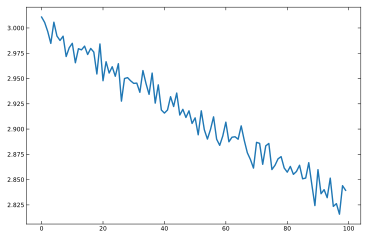

In [805]:
plt.plot(ys)
plt.show()

[[Model]]
    (Model(exponential, prefix='expmod_') + Model(constant, prefix='constmod_'))
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 29
    # data points      = 100
    # variables        = 3
    chi-square         = 0.00894985
    reduced chi-square = 9.2267e-05
    Akaike info crit   = -926.128816
    Bayesian info crit = -918.313305
[[Variables]]
    expmod_decay:      10.0727563 +/- 0.25339064 (2.52%) (init = 1.739268)
    expmod_amplitude:  2.00578834 +/- 0.03084858 (1.54%) (init = 3.507675)
    constmod_c:        0.99209966 +/- 0.03299260 (3.33%) (init = 1.806791)
[[Correlations]] (unreported correlations are < 0.100)
    C(expmod_amplitude, constmod_c)   = -0.997
    C(expmod_decay, constmod_c)       = -0.993
    C(expmod_decay, expmod_amplitude) =  0.983



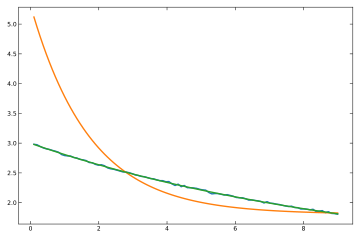

In [848]:
xs = np.linspace(0.1,9,100)
ys = 1 + 2*np.exp(-0.1*xs)
ys += 0.01*np.random.randn(xs.size)

import lmfit

expmod = lmfit.models.ExponentialModel(prefix='expmod_')
constmod = lmfit.models.ConstantModel(prefix='constmod_')

tail = np.min(ys) if ys[0] > ys[-1] else np.max(ys)
params = expmod.guess(ys-tail, x=xs) + constmod.guess(np.ones(ys.size)*tail)
model = expmod + constmod

fit = model.fit(ys, params, x=xs)

print(fit.fit_report())

plt.plot(xs, ys)
plt.plot(xs, fit.init_fit)
plt.plot(xs, fit.best_fit)
plt.show()